# MDS clustering  

#### Pierre Guilmin
November 2018  

## Requirements

Built with R version 3.5.1

- Nicola Roberts HDP R package ([GitHub link](https://github.com/nicolaroberts/hdp)) which implements the hierarchical Dirichlet process:  
    ```R
    devtools::install_github("nicolaroberts/hdp", build_vignettes = TRUE)
    ```


- Various R libraries:
    - `ggplot2`
    - `reshape2`
    - `gridExtra`
    - `tibble`
    - `heatmap3`
    - `survminer`
    - `survival`
    - `RColorBrewer`
    - `IRdisplay`

***

In [134]:
library('ggplot2')
library('reshape2')
library('gridExtra')
library('tibble')
library('heatmap3')
library('survminer')
library('survival')
library('RColorBrewer')
library('IRdisplay')

source('utils/tools.R')     # custom tools function
source('utils/hdp_tools.R') # hdp related functions

theme_set(theme_minimal())

# set jupyer notebook parameters
options(repr.plot.res        = 100, # set a medium-definition resolution for the jupyter notebooks plots (DPI)
        repr.matrix.max.rows = 200, # set the maximum number of rows displayed
        repr.matrix.max.cols = 100) # set the maximum number of columns displayed

# Get data

In [2]:
# get cytogenetics data
dd_cyto <- read.table("data/dd_cyto_cut15.tsv", sep = '\t', stringsAsFactors = FALSE, header = TRUE)

# get mutation data
dd_mutation <- read.table("data/dd_mutation_hotspot_cut10.tsv", sep = '\t', stringsAsFactors = FALSE, header = TRUE)

# merge cytogenetics and mutation data
cat(all(rownames(dd_mutation) == rownames(dd_cyto)), '\n\n') # check if same row ordering
dd_all <- cbind(dd_mutation, dd_cyto)

print_size(dd_all)
head(dd_all, 3)

TRUE 

Size of dd_all: 3300 x 157

,ARID1A,ARID2,ASXL1,ASXL2,ATRX,BCOR,BCORL1,BRAF,BRCC3,CALR,CBL,CDKN1B,CDKN2A,CEBPA,CREBBP,CSF1R,CSF3R,CSNK1A1,CTCF,CUX1,DDX23,DDX4,DDX41,DDX54,DHX33,DICER1,DNMT3A,DNMT3B,EED,EGFR,EP300,ETNK1,ETV6,EZH2,FAM175A,FLT3,GATA1,GATA2,GNAS,GNB1,HIPK2,IDH1,IDH2_140,IDH2_172,IRF1,JAK2,JARID2,KDM5C,KDM6A,KIT,⋯,del5q,plus8,del7,delY,del20q,mar,del7q,del12p,del11q,del18,del17p,del5,plus21,del17,del13,del3p,plus1q,del16,del20,plus11q,plus1p,del16q,del12,del1p,plus19,del13q,del21,del9q,plus1,plus22,plus17q,del4q,plus11,plus14,del3,del3q,plus17p,r_3_3,del11p,del14,del15,delX,plus9,r_9_9,plus13,plus15,r_1_7,del22,ring,WGA
I-H-132697-T1-1-D1-1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
I-H-132698-T1-1-D1-1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
I-H-116889-T2-1-D1-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0


**164** patients don't have any event:

In [3]:
nrow(dd_all[apply(dd_all, 1, function(x) sum(x)) == 0,])

[1] 164

# Run HDP

We run HDP using multiple independent posterior sampling chains and a initial number of raw cluster of 15 (`initcc = 15`).  
All the functions used are defined in `utils/hdp_tools.R` and make use of Nicola Roberts HDP R package (see notebook header).  
To follow the HDP terminology, in the rest of the notebook the term *component* is used for cluster and the term *category* is used for one gene/cytogenetic feature (ie we have 157 categories).

In [4]:
# initialise hdp
hdp <- initialise_hdp(dd_all)

Initialise HDP on a 3300 x 157 dataframe
  → create HDP structure... done!
  → add DP node for each patient... done!
  → assign the data to the nodes... done!


In [5]:
# run multiple independent posterior sampling chains with different random seeds

number_of_chains <- 3
chain_list <- vector('list', number_of_chains)

for (i in 1:number_of_chains) {
    seed <- i * 100
    print_and_flush(sprintf('### Experiment %d (seed = %d) ###\n', i, seed))
    
    # run single hdp chain
    chain_list[[i]] <- activate_and_run_hdp(hdp,
                                            initcc = 15,
                                            burnin = 1000,
                                            n      = 300,
                                            space  = 20,
                                            seed   = seed)
    print_and_flush('\n')
}

multi_output <- hdp_multi_chain(chain_list)
multi_output

### Experiment 1 (seed = 100) ###
Activate HDP nodes and run posterior sampling
  → activate HDP nodes... done!
  → run posterior sampling...
[1] "1000 burn-in iterations in 0.2 mins"
[1] "time 1.2 ETC 1.2 mins"

### Experiment 2 (seed = 200) ###
Activate HDP nodes and run posterior sampling
  → activate HDP nodes... done!
  → run posterior sampling...
[1] "1000 burn-in iterations in 0.2 mins"
[1] "time 1.2 ETC 1.3 mins"

### Experiment 3 (seed = 300) ###
Activate HDP nodes and run posterior sampling
  → activate HDP nodes... done!
  → run posterior sampling...
[1] "1000 burn-in iterations in 0.2 mins"
[1] "time 1.2 ETC 1.2 mins"



Object of class hdpSampleMulti 
 Number of chains: 3 
 Total posterior samples: 900 
 Components: NO. Run hdp_extract_components 
 ----------
 Final hdpState from first chain: 
Object of class hdpState 
 Number of DP nodes: 3301 
 Index of parent DP: 0 1 1 1 1 1 1 1 1 1 ...
 Number of data items per DP: 0 9 3 5 10 1 0 4 3 6 ...
 Index of conparam per DP: 1 1 1 1 1 1 1 1 1 1 ...
 Conparam hyperparameters and current value:
           Shape Rate    Value
Conparam 1     1    1 1.602232
 Number of data categories: 157 
 Number of clusters: 14 
 Initialised with 15 clusters, using random seed 100 

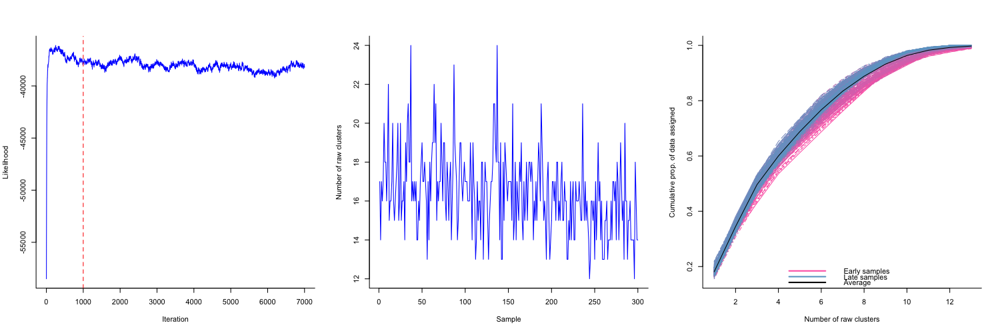

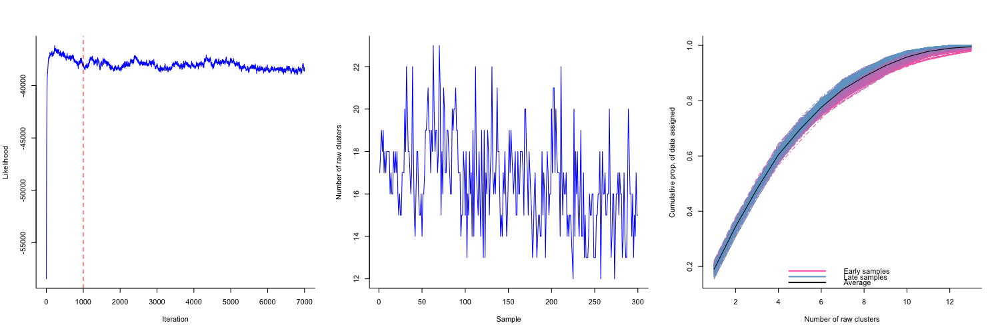

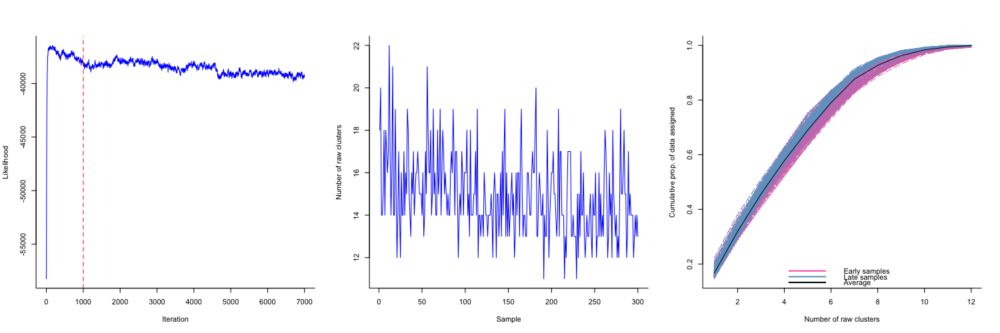

In [6]:
# assess quality of posterior sampling chain
for (experiment in chains(multi_output))
    plot_posterior_sampling_chain_quality(experiment, 15, 5)

Extract HDP components from posterior sampling
  → extract components... done!
* 11 components found


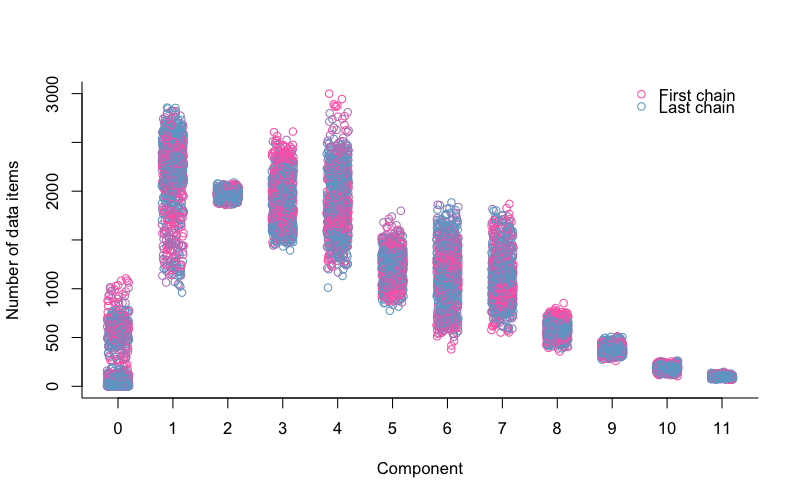

In [7]:
# extract and plot components
multi_output <- extract_components(multi_output)
plot_components_size(multi_output)

WARNING: component 0 is a "garbage" component, not a real component.

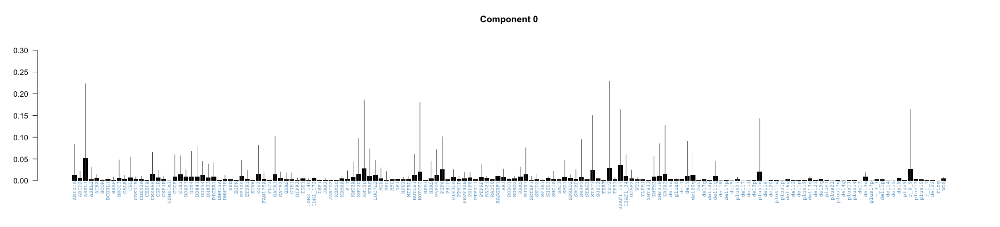

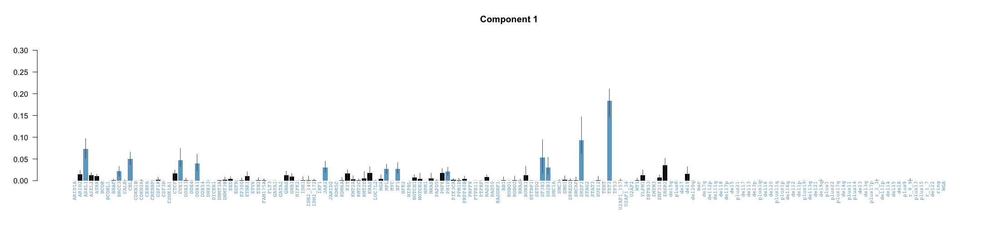

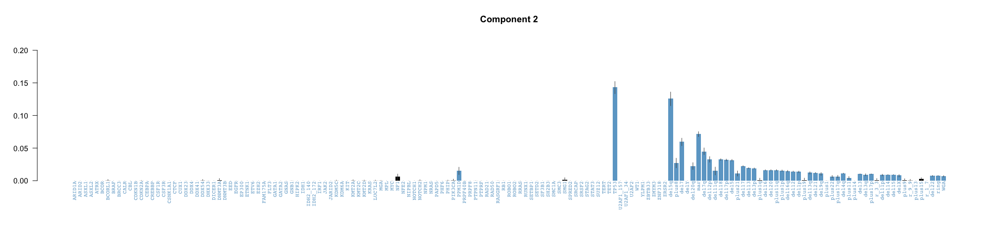

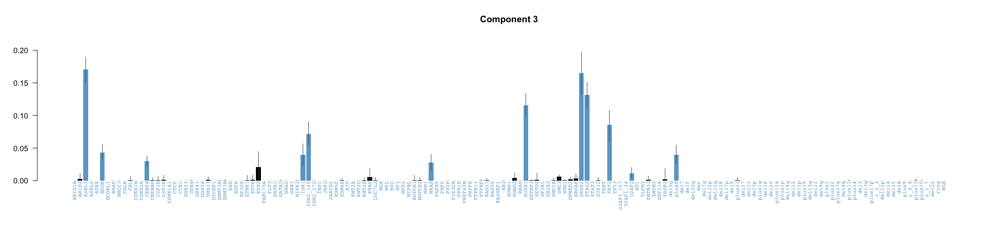

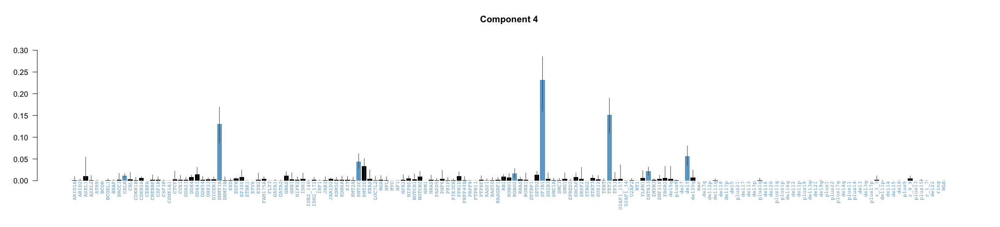

...

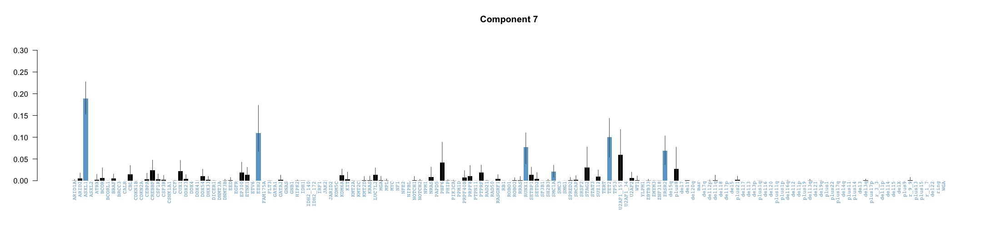

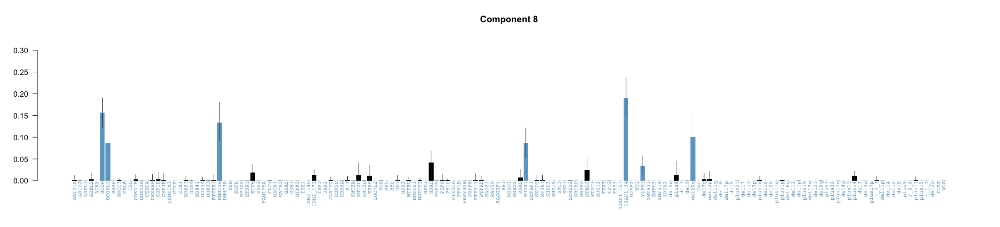

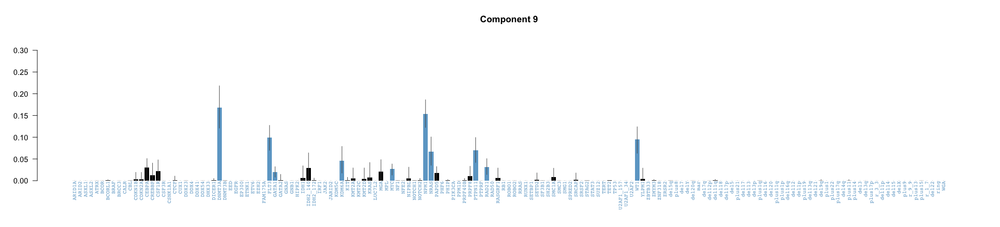

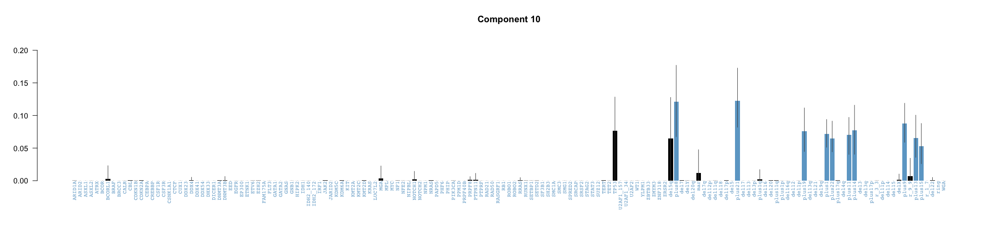

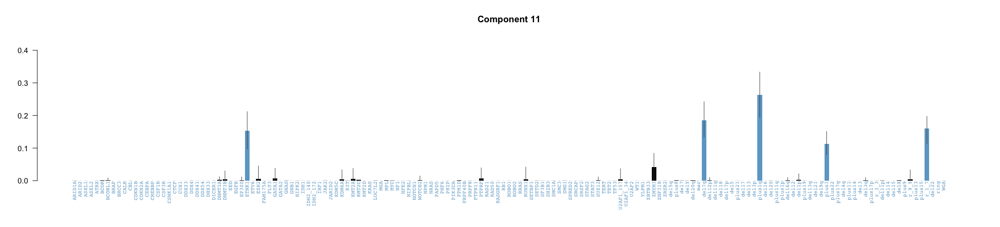

In [8]:
plot_category_distribution_by_component(multi_output, colnames(dd_all))

In [9]:
# get top 7 categories for each component
get_top_categories_by_component(multi_output, colnames(dd_all), top_number = 7)

component_0,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9,component_10,component_11
ASXL1,TET2,TP53,ASXL1,SF3B1,ASXL1,del5q,ASXL1,U2AF1_34,DNMT3A,plus21,plus1q
U2AF1_157,SRSF2,del5q,SRSF2,TET2,SETBP1,SF3B1,EZH2,BCOR,NPM1,plus8,del7q
TET2,ASXL1,mar,STAG2,DNMT3A,U2AF1_157,DNMT3A,TET2,DNMT3A,FLT3,plus9,r_1_7
KMT2D,SF3B1,del7,RUNX1,delY,del7,TP53,RUNX1,del20q,WT1,plus14,ETNK1
r_9_9,CBL,del7q,TET2,KMT2C,ETV6,plus8,ZRSR2,BCORL1,PTPN11,TP53,plus1
PHF6,CUX1,del12p,IDH2_140,KMT2D,RUNX1,CSNK1A1,U2AF1_157,RUNX1,NRAS,plus19,ZMYM3
STAT3,DDX41,del18,BCOR,ZBTB33,PTPN11,TET2,PHF6,NRAS,KDM6A,plus1,GATA1


# Study HDP components

Let's get the probability prediction for each patient and each component. Notice that the 164 patients with no mutation/cytogenetics are `NA` rows.

In [10]:
dd_predicted <- get_prediction_result_dataframe(multi_output, dd_all)
head(dd_predicted)

Number of components: 11
Number of NA rows   : 164


component_0,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9,component_10,component_11,predicted_component,max_proba
0.01691358,0.04098765,0.009382716,0.07901235,0.16148148,0.37283951,0.0795061728,0.08716049,0.101728395,0.05086420,0,0.0001234568,5,0.3728395
0.11259259,0.03074074,0.000000000,0.16444444,0.06370370,0.11111111,0.0007407407,0.48851852,0.014814815,0.01333333,0,0.0000000000,7,0.4885185
0.01044444,0.02488889,0.002888889,0.02133333,0.40977778,0.36800000,0.0244444444,0.07177778,0.008444444,0.05777778,0,0.0002222222,4,0.4097778
0.01444444,0.11433333,0.071888889,0.04766667,0.04400000,0.03044444,0.0033333333,0.64288889,0.006555556,0.01188889,0,0.0125555556,7,0.6428889
0.02555556,0.19777778,0.000000000,0.33333333,0.02555556,0.18222222,0.0000000000,0.23555556,0.000000000,0.00000000,0,0.0000000000,3,0.3333333
NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
n_components <- ncol(dd_predicted) - 2 - 1 # without columns 'component_0', 'predicted_component' and 'max_proba'
n_components

[1] 11

Component size in the dataset:

In [12]:
get_table(dd_predicted[,'predicted_component'])

values,count,freq
1,665,20.2%
4,654,19.8%
3,463,14%
2,355,10.8%
6,287,8.7%
5,243,7.4%
7,205,6.2%
NaN,164,5%
8,151,4.6%
9,75,2.3%


In [13]:
plot_continous_feature_by_components <- function(data, feature_name, scale_y) {    
    set_notebook_plot_size(25, 7)
    
    myLabeller <- function(x) {
        x$predicted_component <- apply(x, 1, function(s) sprintf('Component %s (n = %d)', s, nrow(data[data$predicted_component == s,])))
        return (x)
    }
        
    n_initial <- nrow(data)
    data <- data[!is.na(data[feature_name]),]
                                       
    p1 <- ggplot(data) + geom_boxplot(aes_string('predicted_component', feature_name, fill = 'predicted_component'), alpha = 0.7, notch = TRUE) + scale_fill_brewer(palette = 'Spectral', na.value = 'grey') +
              ggtitle(sprintf('%s density by component\n(removed %d NA values)', feature_name, n_initial - nrow(data))) +  theme(plot.title = element_text(size = 18, face = "bold"))
                                       
    p2 <- ggplot(data) + geom_violin(aes_string('predicted_component', feature_name, fill = 'predicted_component'), alpha = 0.7) + scale_fill_brewer(palette = 'Spectral', na.value = 'grey') +
              ggtitle(' \n ') +  theme(plot.title = element_text(size = 18, face = "bold"))

    p3 <- ggplot(data) + geom_density(aes_string(feature_name, fill = 'predicted_component'), alpha = 0.7) + scale_fill_brewer(palette = 'Spectral', na.value = 'grey') +
              facet_wrap(~ predicted_component, ncol = 4, labeller = myLabeller) +
              ggtitle(' \n ') +  theme(plot.title = element_text(size = 18, face = "bold"))
                                       
    if (scale_y) {
        p1 <- p1 + scale_y_sqrt()
        p2 <- p2 + scale_y_sqrt()
    }
                                       
    grid.arrange(p1, p2, p3, ncol = 3)
}

#suppressWarnings(plot_continous_feature_by_components(dd_clinical, 'HB', TRUE))

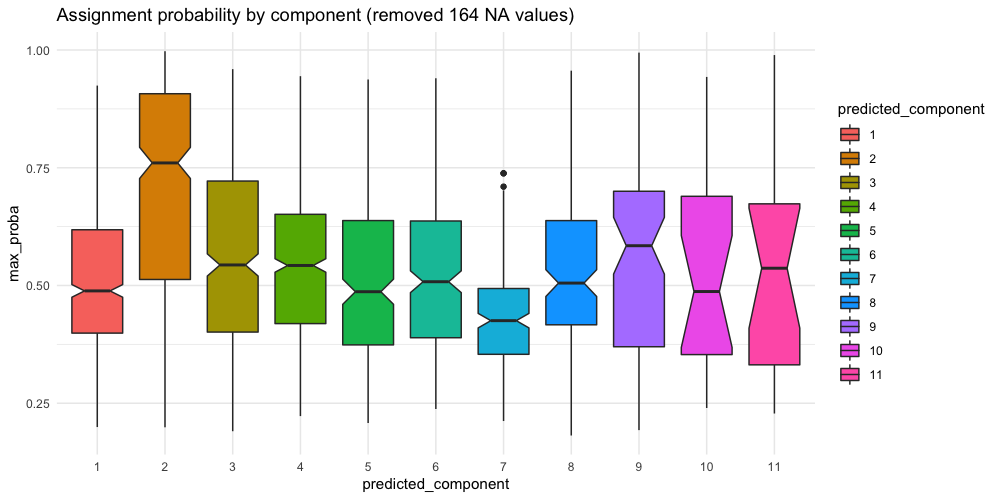

In [15]:
plot_assignement_probability_by_component(dd_predicted)

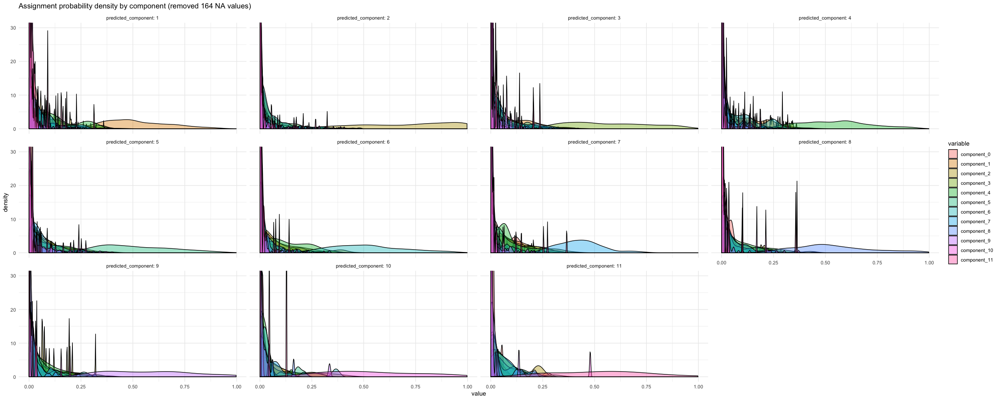

In [16]:
plot_assignement_probability_distribution_by_component(dd_predicted, 25, 10)

# Components heatmap

In [136]:
# merge patient information dataframe with predicted probability and component
dd_clustered <- cbind(dd_all, dd_predicted)
dd_clustered <- rownames_to_column(dd_clustered, var = 'patient_key')

# sort by decreseasing component size and increasing assignemnt probability
categories_table <- get_table(dd_clustered[,'predicted_component'], add_total_count = FALSE)
dd_clustered$predicted_component <- factor(dd_clustered$predicted_component, levels = categories_table$values)
dd_clustered <- dd_clustered[order(dd_clustered$predicted_component, dd_clustered$max_proba),]

print_size(dd_clustered)
head(dd_clustered, 3)

ERROR: Error in cbind(dd_all, dd_predicted): object 'dd_predicted' not found


In [138]:
# compute column separators position
col_sep <- c(cumsum(categories_table$count))
col_sep <- col_sep[-length(col_sep)] # remove last separator

# compute row separators position
row_sep <- c(58, 6, 15, 8, 11, 7, 2, 50)
row_sep_cum <- c(cumsum(row_sep))
row_sep_cum <- row_sep_cum[-length(row_sep_cum)]

# compute row colors vector
sep_color <- rev(c(rgb(180/255, 142/255, 84/255),
                   rgb(146/255, 187/255, 105/255),
                   rgb(233/255, 72/255 , 157/255),
                   rgb(72/255 , 169/255, 137/255),
                   rgb(226/255, 146/255, 102/255),
                   rgb(140/255, 137/255, 190/255),
                   rgb(238/255, 198/255, 116/255),
                   rgb(0/255, 0/255, 0/255)))
row_colors <- c()
for (i in 1:length(row_sep))
    row_colors <- c(row_colors, rep(sep_color[i], row_sep[i]))

In [139]:
# manual gene grouping
col_order <- c(
'ARID1A', 'ARID2', 'BCORL1', 'BRCC3', 'CALR', 'CDKN1B', 'CDKN2A', 'CEBPA', 'CREBBP', 'CSF1R', 'CSF3R', 'CSNK1A1', 'DDX23', 'DDX4', 'DDX41',
'DDX54', 'DHX33', 'DICER1', 'DNMT3B', 'EED', 'EGFR', 'ETNK1', 'FAM175A', 'HIPK2', 'JAK2', 'JARID2', 'KDM5C', 'KMT2C', 'KMT2D', 'LUC7L2',
'MGA', 'MPL', 'NFE2', 'NIPBL', 'NOTCH2', 'NPM1', 'PAPD5', 'PHIP', 'PIK3CA', 'PRPF40B', 'PTPRF', 'RAD50', 'RASGRF1', 'RB1', 'ROBO1', 'ROBO2',
'RRAS', 'SETD2', 'SMG1', 'SPRED2', 'SRCAP', 'STAT3', 'SUZ12', 'TERT', 'YLPM1', 'ZBTB33', 'ZMYM3', 'ZNF318',

'ASXL1', 'BCOR', 'EZH2', 'RAD21', 'STAG2', 'ASXL2',

'ATRX', 'CUX1', 'GNAS', 'IRF1', 'KDM6A', 'KMT2A', 'NOTCH1', 'PHF6', 'SETBP1', 'WT1', 'SH2B3', 'SMC1A', 'EP300', 'SMC3', 'GNB1',

'BRAF', 'CBL', 'FLT3', 'KIT', 'KRAS', 'NF1', 'NRAS', 'PTPN11',

'DNMT3A', 'IDH1', 'IDH2_140', 'IDH2_172', 'TET2', 'ETV6', 'GATA1', 'GATA2', 'RUNX1', 'CTCF', 'MYC',

'SF3B1', 'SRSF2', 'U2AF1_157', 'U2AF1_34', 'U2AF2', 'ZRSR2', 'PRPF8',

'PPM1D', 'TP53',

'del1p', 'del3', 'del3q', 'del4q', 'del5', 'del5q', 'del7', 'del7q', 'del9q', 'del11p', 'del11q', 'del12', 'del12p', 'del13', 'del13q',
'del3p', 'del14', 'del15', 'del16', 'del16q', 'del17', 'del17p', 'del18', 'del20', 'del20q', 'del21', 'del22', 'delX', 'delY',
'plus1', 'plus1p', 'plus1q', 'plus8', 'plus9', 'plus11', 'plus11q', 'plus13', 'plus14', 'plus15', 'plus17p', 'plus17q', 'plus19', 'plus21', 'plus22',
'ring', 'mar', 'WGA', 'r_3_3', 'r_9_9', 'r_1_7'
)
length(col_order) # check that we have all 157 categories

[1] 157

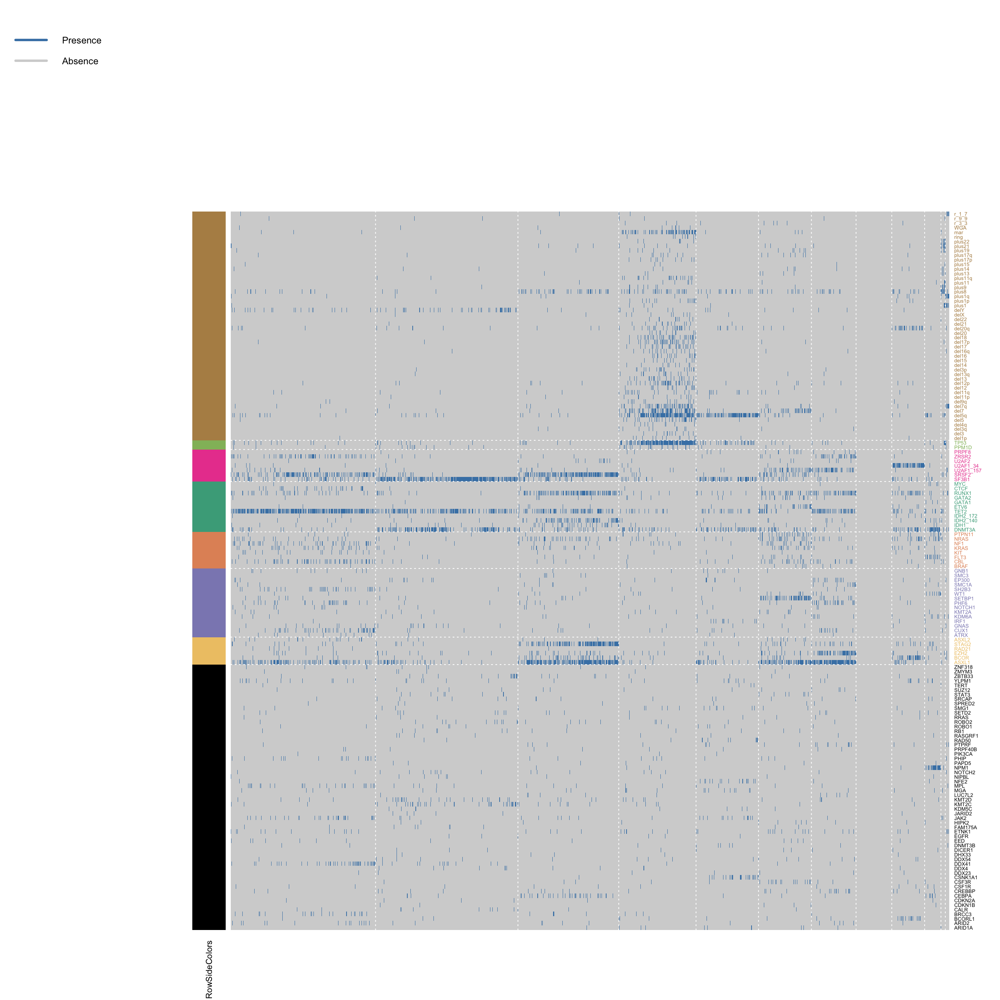

In [148]:
# set a high-definition resolution for this plot (DPI)
options(repr.plot.res = 200)
set_notebook_plot_size(13, 13)

# plot the heatmap
heatmap3(t(as.matrix(dd_clustered[,col_order])),
         
         # no dendogram, no scaling, small legend
         Rowv = NA, Colv = NA, labCol = FALSE, scale = 'none', legendfun = function() showLegend(legend=c('Presence', 'Absence'), col=c('steelblue', 'lightgrey')),
         col = c('lightgrey', 'steelblue'),
        
         # set row colors
         RowSideColors = row_colors,
         RowAxisColors = 1,
         
         ColSideAnn = dd_clustered$predicted_component,
         
         # add horizontal and vertical lines (+ 0.5 to be at the exact separation)
         add.expr = abline(v = col_sep + 0.5,
                           h = row_sep_cum + 0.5,
                           col = 'white', lwd = 1, lty = 'dotted'),
         
         # row label size
         cexRow = 0.4)

# Categories distribution by component

In [21]:
categories_table

values,count,freq
1,665,20.2%
4,654,19.8%
3,463,14%
2,355,10.8%
6,287,8.7%
5,243,7.4%
7,205,6.2%
NaN,164,5%
8,151,4.6%
9,75,2.3%


In [22]:
# create a dataframe showing the count by component for each category

categories_repartition <- data.frame(category = colnames(dd_all))

for (i in 1:n_components)
    categories_repartition[sprintf('component_%d', i)] <- apply(categories_repartition, 1, function(s) sum(dd_clustered[dd_clustered$predicted_component == i, s['category']]))
                   
# sort categories_repartition by most frequent genes
categories_repartition['total_count'] <- rowSums(categories_repartition[,-1])
categories_repartition <- categories_repartition[order(categories_repartition$total_count, decreasing = TRUE),]
head(categories_repartition)

,category,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9,component_10,component_11,total_count
97,TET2,412,32,149,234,38,43,83,21,11,5,0,1028
3,ASXL1,169,18,298,72,125,31,164,22,1,2,3,905
85,SF3B1,101,16,42,410,23,114,10,15,5,0,0,736
92,SRSF2,202,8,274,21,48,2,4,1,4,3,2,569
27,DNMT3A,35,44,37,213,29,73,8,49,36,3,3,530
108,del5q,21,217,12,11,13,166,2,3,7,9,0,461


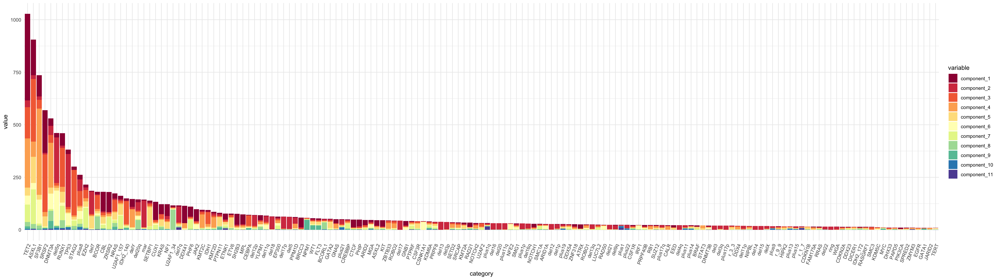

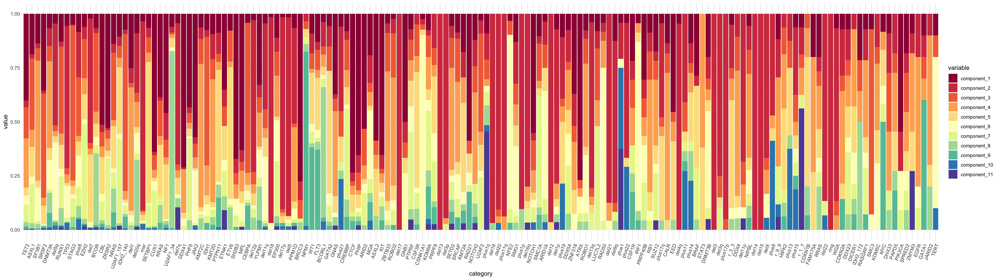

In [23]:
# plot category distribution colored by component count

# transform (extand) categories_repartition in a long data frame by gathering the components columns in one column
long_categories_repartition <- melt(categories_repartition, id = c('category', 'total_count'))
# sort long_gene_repartition by most frequent genes
long_categories_repartition$category <- factor(long_categories_repartition$category, levels = categories_repartition$category)
long_categories_repartition <- long_categories_repartition[order(long_categories_repartition$category),]

set_notebook_plot_size(25, 7)
# count plot
ggplot(long_categories_repartition) +
    geom_bar(aes(category, value, fill = variable), stat = 'identity') +
    tilt_x_label(70) +
    scale_fill_brewer(palette = 'Spectral', na.value = 'grey')

# proportion plot
ggplot(long_categories_repartition) +
    geom_bar(aes(category, value, fill = variable), stat = 'identity', position = 'fill') +
    tilt_x_label(70) +
    scale_fill_brewer(palette = 'Spectral', na.value = 'grey')

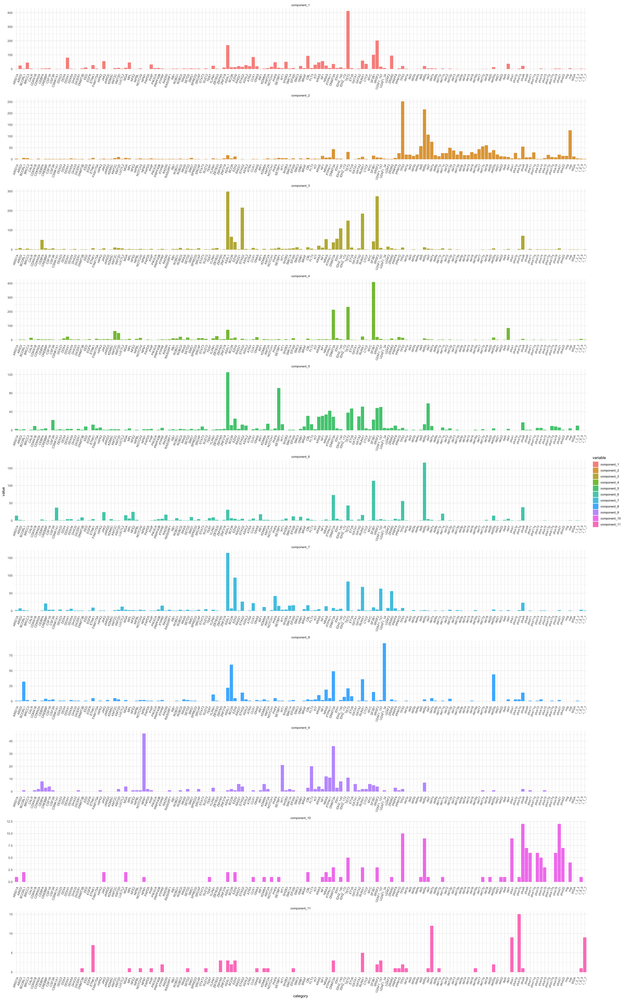

In [24]:
# plot category distribution by component

# sort long_gene_repartition by heatmap gene order
long_categories_repartition$category <- factor(long_categories_repartition$category, levels = col_order)
long_categories_repartition <- long_categories_repartition[order(long_categories_repartition$category),]

# plot category distribution by component
set_notebook_plot_size(25, 40)
ggplot(long_categories_repartition) + geom_bar(aes(category, value, fill = variable), stat='identity', alpha = 0.8) + tilt_x_label(70) + facet_wrap(~ variable, ncol = 1, scales = 'free')

In [25]:
# save dd_clustered
write.table(dd_clustered, file = 'data/dd_clustered.tsv', sep = '\t')

In [4]:
dd_clustered <- read.table("data/dd_clustered.tsv", sep = "\t", stringsAsFactors = FALSE, header = TRUE)

In [5]:
dd_clustered$predicted_component <- factor(dd_clustered$predicted_component)

# Comutation plots

From Elsa:

![](results/comutation_pattern_cut1.png)

![](results/comutation_pattern_cut3.png)

# Clinical correlations

In [6]:
# get clinical data
dd_clinical <- read.table('data/df_clinical_selected.tsv', sep = '\t', stringsAsFactors = FALSE, header = TRUE)

# merge with clustering data (that already contains mutation and cytogenetics data)
dd_clinical <- merge(dd_clustered, dd_clinical, by.x = 'patient_key', by.y = 'LEUKID')

print_size(dd_clinical)
head(dd_clinical, 2)

Size of dd_clinical: 3300 x 235

patient_key,ARID1A,ARID2,ASXL1,ASXL2,ATRX,BCOR,BCORL1,BRAF,BRCC3,CALR,CBL,CDKN1B,CDKN2A,CEBPA,CREBBP,CSF1R,CSF3R,CSNK1A1,CTCF,CUX1,DDX23,DDX4,DDX41,DDX54,DHX33,DICER1,DNMT3A,DNMT3B,EED,EGFR,EP300,ETNK1,ETV6,EZH2,FAM175A,FLT3,GATA1,GATA2,GNAS,GNB1,HIPK2,IDH1,IDH2_140,IDH2_172,IRF1,JAK2,JARID2,KDM5C,KDM6A,⋯,PATIENT_RECEIVED_MORE_THAN_1_DMT,PATIENT_RECEIVED_MORE_THAN_1_TPL,CENTER,CENTER_COHORT,BATCH,FLAG_KEEP_REASON,FLAG_ISSUE_DATE,AML,SEX_INFER_SEQUENCING,FLAG_ISSUE_SEX,DIAG_PB_BLAST_RANGE,SAMPLE_PB_BLAST_RANGE,DIAG_RINGED_SIDEROBLASTS_RANGE,DIAG_BM_BLAST_RANGE,SAMPLE_RINGED_SIDEROBLASTS_RANGE,SAMPLE_BM_BLAST_RANGE,QC_DETAILED,SELECTED_SAMPLE,time_diag_sample_days,time_diag_sample_range,type_of_dmt,DMT_STRICT,is_sample_naive,dmt_stage,WHO_2008,FAB,PB_BLAST,LDH,FERRITIN,WBC,ANC,HB,PLT,MONOCYTES,BM_BLAST,CYTOGENETICS,NUMBER_OF_METAPHASES,IPSS,IPSS_R,RINGED_SIDEROBLASTS,RINGED_SIDEROBLASTS_BINARY,RINGED_SIDEROBLASTS_BINARY15,WHO_2008_SIMPLIFY,time_diag_dmt_strict_days,time_diag_transplant_days,is_treated,os_diag_years,os_status,aml,time_diag_aml_days
E-H-100000-T1-1-D1-1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,⋯,NA,NA,IHBT,IHBT_1,B,pass,NA,no,F,NA,<5%,NA,NA,<5%,NA,NA,pass,yes,0,< 1 month,len,yes,naive,after-sample,del(5q),RA,0,7.3,226,7.50,4.65,8.8,406,NA,3,"46,xx,del(5)(q15q33.3)[3]/46,xx[1]",22,low,good,NA,NA,NA,5q-,2432,NA,treated,5.819178,0,no,NA
E-H-100001-T1-1-D1-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,⋯,NA,NA,IHBT,IHBT_1,B,pass,NA,no,F,NA,<5%,NA,NA,<5%,NA,NA,pass,yes,0,< 1 month,,no,naive,no-treatment,RA,RA,0,5.0,103,7.21,2.88,9.8,364,NA,2,"46,xx,del(5)(q13q33)[6]/47,xx,+8[1]/46,xx[15]",22,int1,good,NA,NA,NA,RCUD,NA,NA,not-treated,2.857534,0,no,NA


## Continuous features

In [114]:
plot_continuous_feature_by_components <- function(data, feature_name, scale_y_sqrt, colors = colorRampPalette(brewer.pal(11, "Spectral"))(12)) {
    # Plot the distribution of a continuous feature across the components, produce boxplot, violin plot and density plots side by side
    # → Arguments
    #     - data        : dataframe with one row per patient and one column `predicted_component` as well as one column for the continuous feature to plot
    #     - feature_name: name of the continuous feature to plot
    #     - scale_y_sqrt: wheter to plot with a sqrt y scale or not
     
    set_notebook_plot_size(25, 7)
    
    # custom labeller for facet_wrap for density plot
    myLabeller <- function(x) {
        x$predicted_component <- apply(x, 1, function(s) sprintf('Component %s (n = %d)', s, nrow(data[data$predicted_component == s,])))
        return (x)
    }
        
    # remove NA values
    n_initial <- nrow(data)
    data <- data[!is.na(data[feature_name]),]
    
    # boxplot
    p1 <- ggplot(data) +
              geom_boxplot(aes_string('predicted_component', feature_name, fill = 'predicted_component'), alpha = 0.7, notch = TRUE) +
              scale_fill_manual(values = colors) +
              ggtitle(sprintf('%s density by component\n(removed %d NA values)', feature_name, n_initial - nrow(data))) +
              theme(plot.title = element_text(size = 18, face = "bold"))
    
    # violin plot
    p2 <- ggplot(data) + geom_violin(aes_string('predicted_component', feature_name, fill = 'predicted_component'), alpha = 0.7) +
              scale_fill_manual(values = colors) +
              ggtitle(' \n ') +
              theme(plot.title = element_text(size = 18, face = "bold"))
    
    # density plot
    p3 <- ggplot(data) + geom_density(aes_string(feature_name, fill = 'predicted_component'), alpha = 0.7) +
              facet_wrap(~ predicted_component, ncol = 4, labeller = myLabeller) +
              scale_fill_manual(values = colors) +
              ggtitle(' \n ') +
              theme(plot.title = element_text(size = 18, face = "bold"))
                                       
    if (scale_y_sqrt) {
        p1 <- p1 + scale_y_sqrt()
        p2 <- p2 + scale_y_sqrt()
    }
    
    # plot the three plots side by side and remove ggplot warnings
    suppressWarnings(suppressMessages(grid.arrange(p1, p2, p3, ncol = 3)))
}

# plot_continuous_feature_by_components(dd_clinical, 'HB', TRUE)

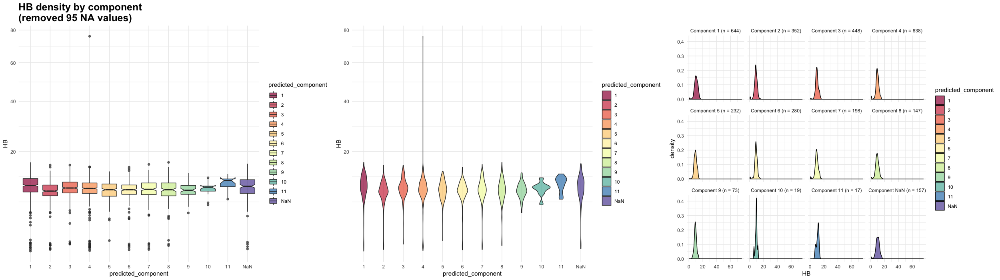

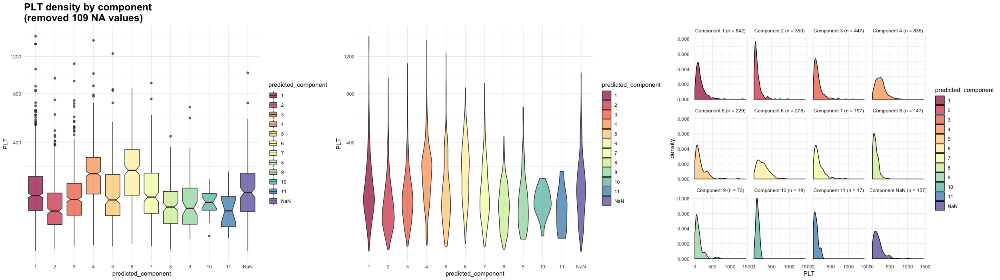

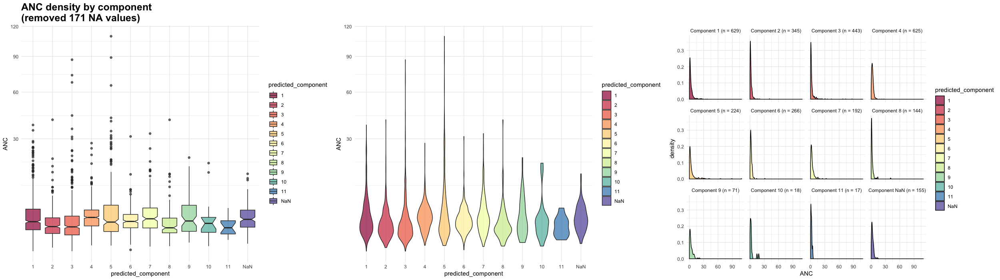

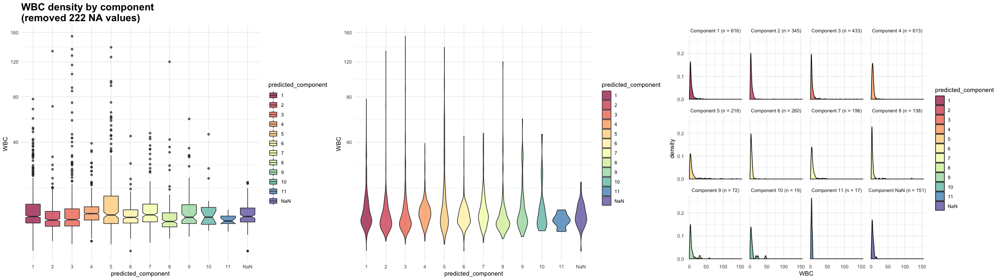

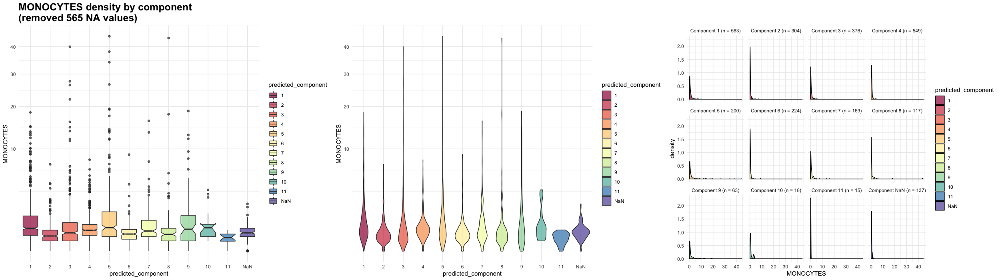

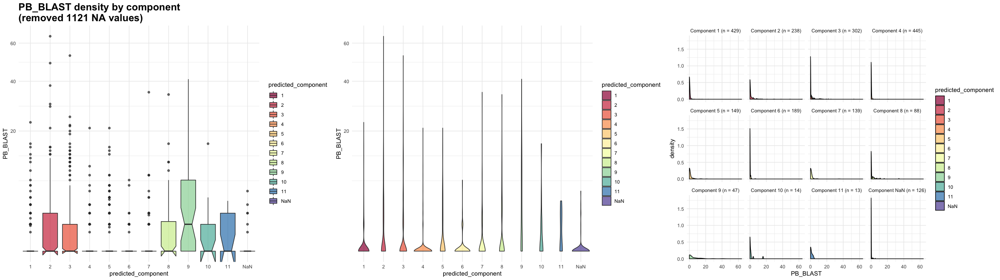

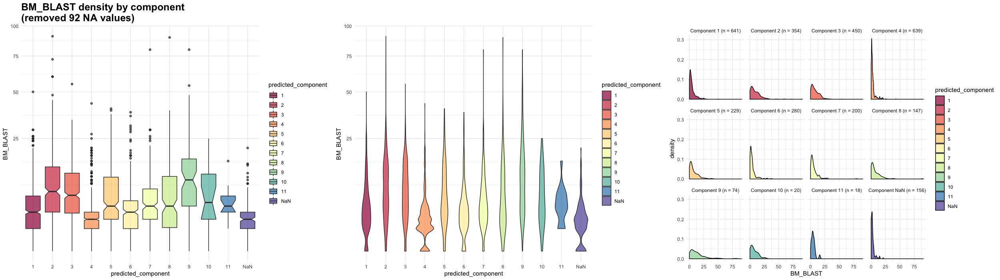

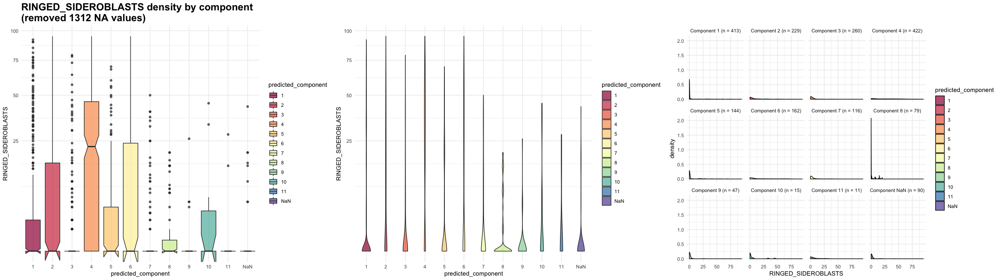

In [8]:
# plot the distribution of multiple continuous features accross components
for (feature_name in c('HB', 'PLT', 'ANC', 'WBC', 'MONOCYTES', 'PB_BLAST', 'BM_BLAST', 'RINGED_SIDEROBLASTS')) {
    plot_continuous_feature_by_components(dd_clinical, feature_name, TRUE)
}

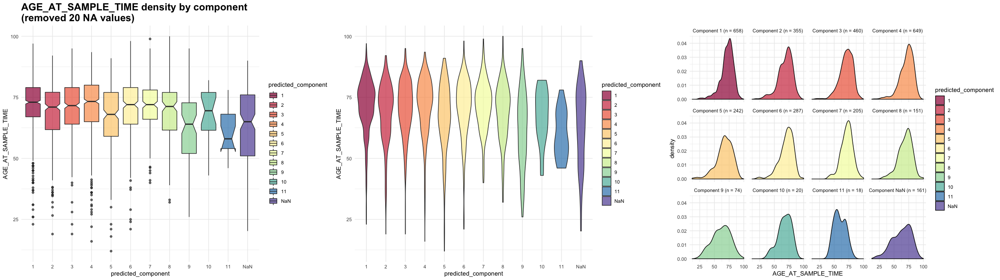

In [9]:
plot_continuous_feature_by_components(dd_clinical, 'AGE_AT_SAMPLE_TIME', FALSE)

## Categorical features

In [10]:
plot_categorical_feature_by_components <- function(data, feature_name) {
    # Plot the distribution of a categorical feature across the components
    # → Arguments
    #     - data        : dataframe with one row per patient and one column `predicted_component` as well as one column for the categorical feature to plot
    #     - feature_name: name of the categorical feature to plot
    
    set_notebook_plot_size(25, 5)

    # remove NA values
    n_initial <- nrow(data)
    data <- data[!is.na(data[feature_name]),]
    
    # categorical feature distribution for each component
    p1 <- ggplot(data) +
              geom_bar(aes_string('predicted_component', fill = feature_name), position = 'fill') +
              ggtitle(sprintf('%s count and proportion by component\n(removed %d NA values)', feature_name, n_initial - nrow(data))) +
              theme(plot.title = element_text(size = 18, face = "bold"))
    
    # categorical feature distribution by component
    p2 <- ggplot(data) +
              geom_bar(aes_string(feature_name, fill = 'predicted_component'), position = 'fill') +
              scale_fill_manual(values = colorRampPalette(brewer.pal(11, "Spectral"))(12)) +
              ggtitle(' \n ') +
              theme(plot.title = element_text(size = 18, face = "bold"))
    
    # categorical feature count by component
    p3 <- ggplot(data) +
              geom_bar(aes_string(feature_name, fill = 'predicted_component'), position = 'dodge') +
              scale_fill_manual(values = colorRampPalette(brewer.pal(11, "Spectral"))(12)) +
              ggtitle(' \n ') + 
              theme(plot.title = element_text(size = 18, face = "bold")) 
    
    # plot the three plots side by side and remove ggplot warnings
    suppressWarnings(suppressMessages(grid.arrange(p1, p2, p3, ncol = 3)))
}

# plot_categorical_feature_by_components(dd_clinical, 'AML')

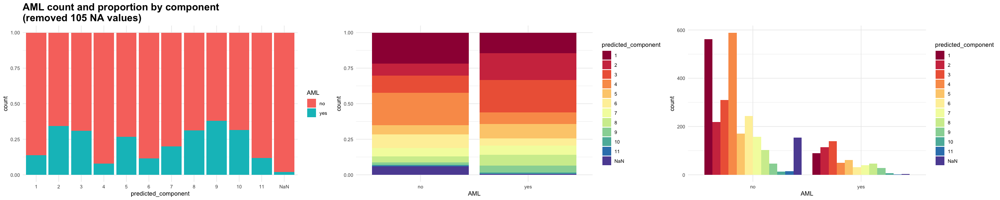

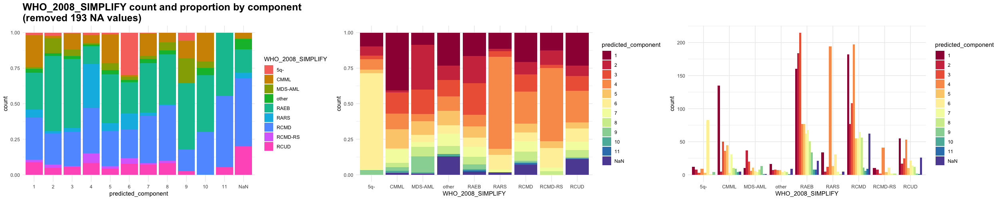

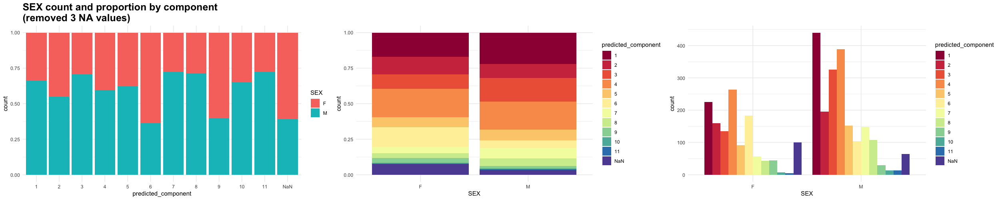

In [11]:
# plot the distribution of multiple categorical features accross components
for (feature_name in c('AML', 'WHO_2008_SIMPLIFY', 'SEX')) {
    plot_categorical_feature_by_components(dd_clinical, feature_name)
}

## By country analysis

In [12]:
# get countries data
dd_countries <- read.table('data/CentersBatches.csv', sep = ',', stringsAsFactors = FALSE, header = TRUE)

# merge with clinical data (that already contains mutation and cytogenetics data as well as clustering data)
dd_clinical <- merge(dd_clinical, unique(dd_countries[, c('center', 'country')]), by.x = 'CENTER', by.y = 'center')

print_size(dd_clinical)
head(dd_clinical, 2)

Size of dd_clinical: 3300 x 236

CENTER,patient_key,ARID1A,ARID2,ASXL1,ASXL2,ATRX,BCOR,BCORL1,BRAF,BRCC3,CALR,CBL,CDKN1B,CDKN2A,CEBPA,CREBBP,CSF1R,CSF3R,CSNK1A1,CTCF,CUX1,DDX23,DDX4,DDX41,DDX54,DHX33,DICER1,DNMT3A,DNMT3B,EED,EGFR,EP300,ETNK1,ETV6,EZH2,FAM175A,FLT3,GATA1,GATA2,GNAS,GNB1,HIPK2,IDH1,IDH2_140,IDH2_172,IRF1,JAK2,JARID2,KDM5C,⋯,PATIENT_RECEIVED_MORE_THAN_1_DMT,PATIENT_RECEIVED_MORE_THAN_1_TPL,CENTER_COHORT,BATCH,FLAG_KEEP_REASON,FLAG_ISSUE_DATE,AML,SEX_INFER_SEQUENCING,FLAG_ISSUE_SEX,DIAG_PB_BLAST_RANGE,SAMPLE_PB_BLAST_RANGE,DIAG_RINGED_SIDEROBLASTS_RANGE,DIAG_BM_BLAST_RANGE,SAMPLE_RINGED_SIDEROBLASTS_RANGE,SAMPLE_BM_BLAST_RANGE,QC_DETAILED,SELECTED_SAMPLE,time_diag_sample_days,time_diag_sample_range,type_of_dmt,DMT_STRICT,is_sample_naive,dmt_stage,WHO_2008,FAB,PB_BLAST,LDH,FERRITIN,WBC,ANC,HB,PLT,MONOCYTES,BM_BLAST,CYTOGENETICS,NUMBER_OF_METAPHASES,IPSS,IPSS_R,RINGED_SIDEROBLASTS,RINGED_SIDEROBLASTS_BINARY,RINGED_SIDEROBLASTS_BINARY15,WHO_2008_SIMPLIFY,time_diag_dmt_strict_days,time_diag_transplant_days,is_treated,os_diag_years,os_status,aml,time_diag_aml_days,country
CCH,E-H-106024-T1-1-D1-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,⋯,NA,NA,CCH_1,D,pass,NA,no,M,NA,<5%,<5%,NA,<5%,NA,<5%,pass,yes,55,1 to 6 months,NA,no,naive,no-treatment,RCMD,RA,0,NA,NA,8.5,6.5,12.4,141,NA,2,"46,xy[29]/45,x,-y[3]",32,low,very_good,NA,NA,NA,RCMD,NA,NA,not-treated,3.350685,0,no,NA,france
CCH,E-H-106025-T1-1-D1-1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,⋯,NA,NA,CCH_1,D,pass,NA,no,M,NA,<5%,<5%,NA,<5%,NA,<5%,pass,yes,16,< 1 month,NA,no,naive,no-treatment,RAEB-1,RAEB,0,NA,NA,6.8,4.9,11.0,48,NA,5,"47,xy,+8[10]/46,xy[10]",20,int1,int,NA,NA,NA,RAEB,NA,NA,not-treated,2.794521,1,no,NA,france


In [13]:
table(dd_clinical$country)


        austria          brazil czech_republica         england          france 
             83             119              33              50             159 
        germany          greece           italy      netherland           spain 
            637              66             572             198             317 
         sweden          taiwan   united_states 
            889             107              70 

In [14]:
dd_clinical$region <- dd_clinical$country
dd_clinical$region[dd_clinical$country %in% c('austria', 'czech_republica', 'england', 'france', 'germany', 'greece', 'italy', 'netherland', 'spain', 'sweden')] <- 'europe'
table(dd_clinical$region)


       brazil        europe        taiwan united_states 
          119          3004           107            70 

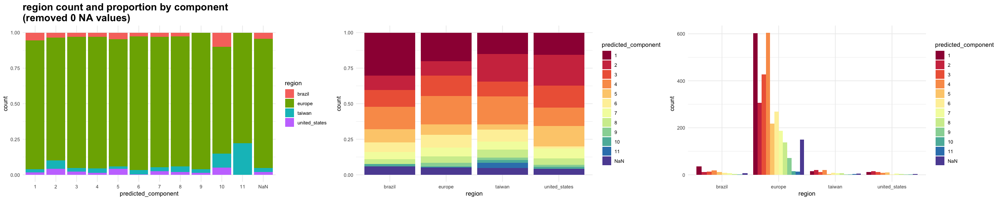

In [15]:
plot_categorical_feature_by_components(dd_clinical, 'region')

# Survival plots

Work in progress...

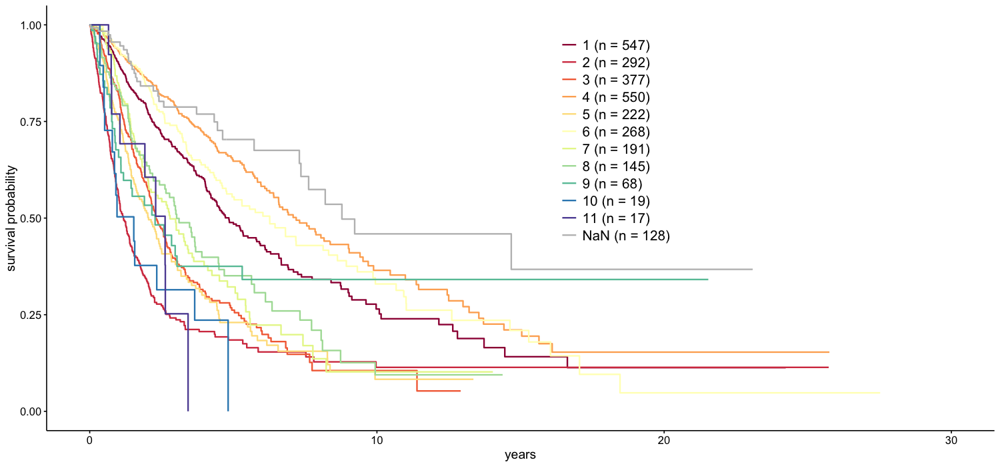

In [18]:
plot_survival_curve <- function(data, stratifier_column_name, colors, line_size = 1.5, legend_size = 20, legend_interspace = 2) {
    formula <- sprintf('Surv(os_diag_years, os_status) ~ %s', stratifier_column_name)
    surv_fit <- surv_fit(as.formula(formula), data = data)
    
    short_names <- sapply(names(surv_fit$strata), function (s) strsplit(s, '=')[[1]][[2]])
    legend_labels <- sprintf('%s (n = %s)', short_names, surv_fit$strata)
    
    ggsurv <- ggsurvplot(surv_fit, censor = FALSE, palette = colors, linetype = 'solid', size = line_size,
                         xlab = 'years', ylab = 'survival probability', legend = c(0.6, 0.7), legend.title = '', legend.labs = legend_labels)
    ggsurv$plot <- ggsurv$plot + theme(legend.text = element_text(size = legend_size), legend.key.size = unit(legend_interspace, 'lines'))

    return (ggsurv$plot)
}

set_notebook_plot_size(15, 7)
plot_survival_curve(dd_clinical, 'predicted_component', c(brewer.pal(11, 'Spectral'), 'grey'), line_size = 0.8, legend_size = 15, legend_interspace = 1.3)

In [117]:
plot_survival_curve_stratified_by_component <- function(dd_clinical, category_name, component) {
    dd_clinical$stratify <- 'wildtype'
    dd_clinical$stratify[dd_clinical[category_name] == 1] <- sprintf('_%s_other', category_name)
    for (i in component)
        dd_clinical$stratify[dd_clinical[category_name] == 1 & dd_clinical$predicted_component == i] <- sprintf('_%s_component_%d', category_name, i)

    stratify_count_table <- get_table(dd_clinical$stratify, add_total_count = FALSE)
    categories <- as.character(stratify_count_table$values)
    display(stratify_count_table)
    
    # plots
    set_notebook_plot_size(20, 6)
    
    # plot 1
    dd_clinical$mutated <- 'wildtype'
    dd_clinical[dd_clinical[category_name] == 1, 'mutated'] <- sprintf('has_%s_mutation', category_name)
    p1 <- plot_survival_curve(dd_clinical, 'mutated', c('orange', 'grey'))

    #plot 2
    colors <- c(c('#D7191C', '#FDAE61', '#ABDDA4', '#2B83BA')[1:(length(categories)-1)], 'grey')
    p2 <- plot_survival_curve(dd_clinical, 'stratify', colors)
    
    grid.arrange(p1, p2, ncol = 2)
}

# plot_survival_curve_stratified_by_component(dd_clinical, 'SF3B1', c(4, 6))

values,count,freq
wildtype,2564,77.7%
_SF3B1_component_4,410,12.4%
_SF3B1_other,212,6.4%
_SF3B1_component_6,114,3.5%


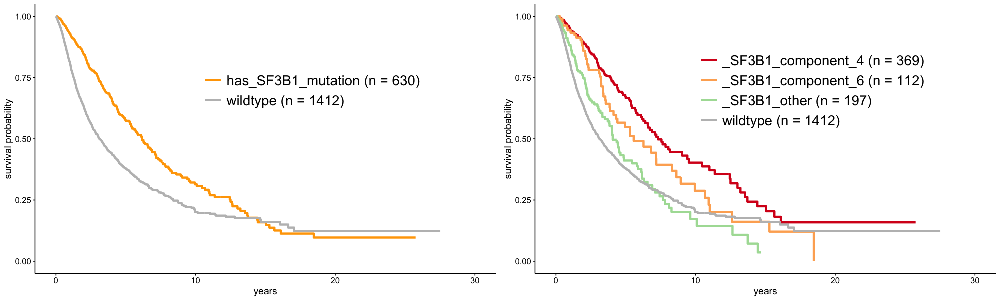

In [151]:
plot_survival_curve_stratified_by_component(dd_clinical, 'SF3B1', c(4, 6))

values,count,freq
wildtype,2731,82.8%
_SRSF2_component_3,274,8.3%
_SRSF2_component_1,202,6.1%
_SRSF2_component_5,48,1.5%
_SRSF2_other,45,1.4%


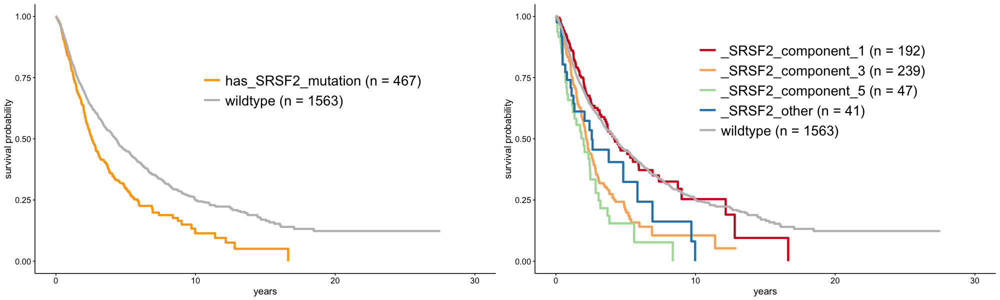

In [21]:
plot_survival_curve_stratified_by_component(dd_clinical, 'SRSF2', c(1, 3, 5))

values,count,freq
wildtype,3138,95.1%
_U2AF1_157_component_7,63,1.9%
_U2AF1_157_component_5,50,1.5%
_U2AF1_157_other,49,1.5%


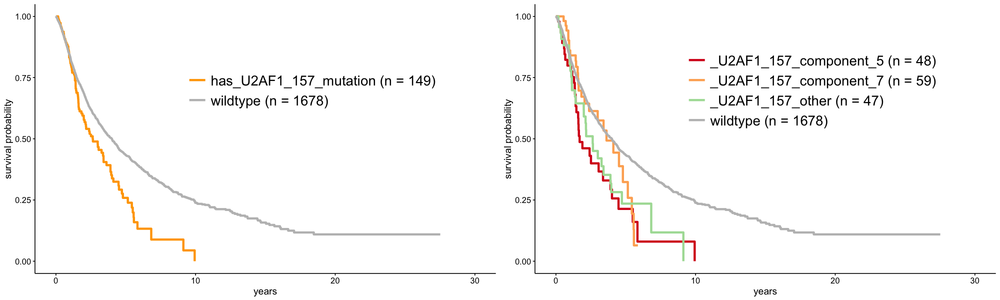

In [22]:
plot_survival_curve_stratified_by_component(dd_clinical, 'U2AF1_157', c(5, 7))

values,count,freq
wildtype,3184,96.5%
_U2AF1_34_component_8,95,2.9%
_U2AF1_34_other,21,0.6%


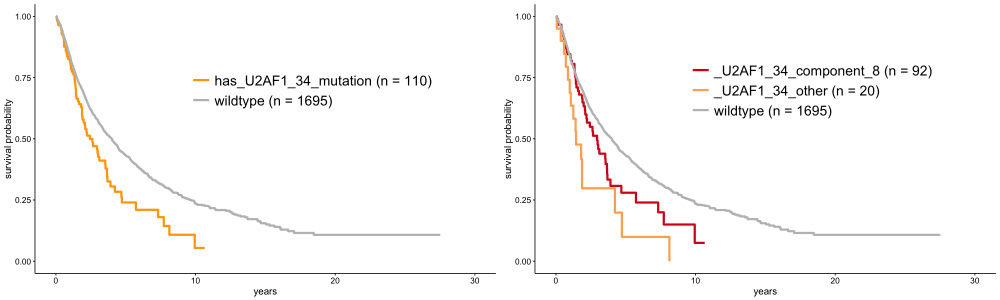

In [23]:
plot_survival_curve_stratified_by_component(dd_clinical, 'U2AF1_34', c(8))

values,count,freq
wildtype,3120,94.5%
_ZRSR2_component_1,95,2.9%
_ZRSR2_component_7,56,1.7%
_ZRSR2_other,29,0.9%


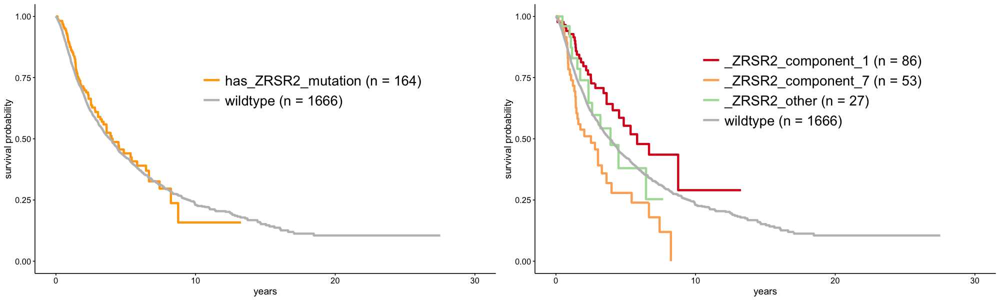

In [24]:
plot_survival_curve_stratified_by_component(dd_clinical, 'ZRSR2', c(1, 7))

values,count,freq
wildtype,2839,86%
_del5q_component_2,217,6.6%
_del5q_component_6,166,5%
_del5q_other,78,2.4%


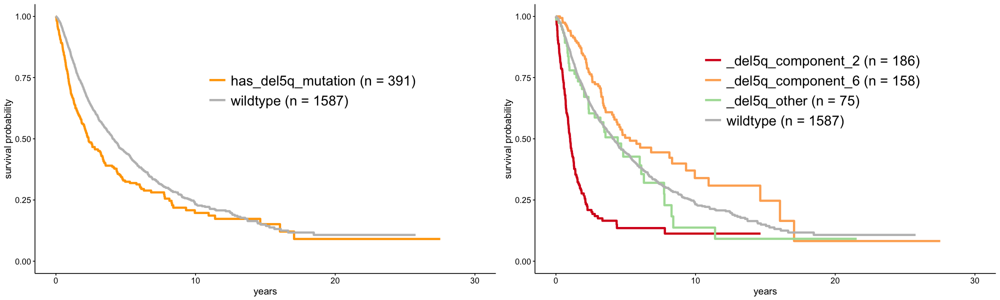

In [25]:
plot_survival_curve_stratified_by_component(dd_clinical, 'del5q', c(2, 6))

values,count,freq
wildtype,2918,88.4%
_TP53_component_2,252,7.6%
_TP53_other,74,2.2%
_TP53_component_6,56,1.7%


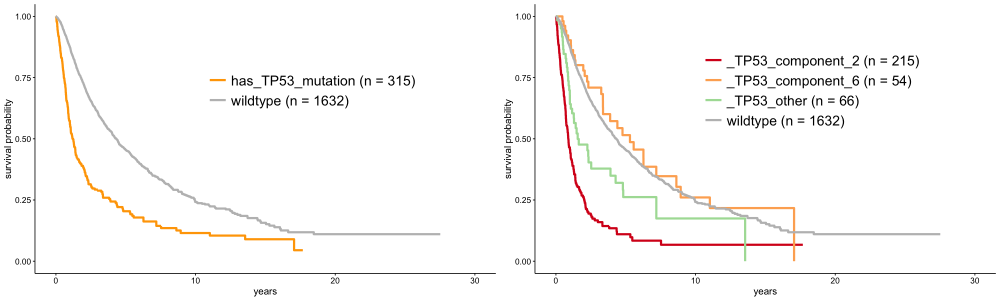

In [26]:
plot_survival_curve_stratified_by_component(dd_clinical, 'TP53', c(2, 6))

# IPSSR

In [65]:
get_table(dd_clinical$IPSS_R)

values,count,freq
good,924,36.7%
int,530,21%
very_good,394,15.6%
poor,386,15.3%
very_poor,286,11.3%
-- total --,3300,100%


In [66]:
dd_clinical$IPSS_R_simplified <- dd_clinical$IPSS_R
dd_clinical$IPSS_R_simplified[dd_clinical$IPSS_R %in% c('very_good', 'good')] <- 'good'
dd_clinical$IPSS_R_simplified[dd_clinical$IPSS_R %in% c('very_poor', 'poor')] <- 'poor'

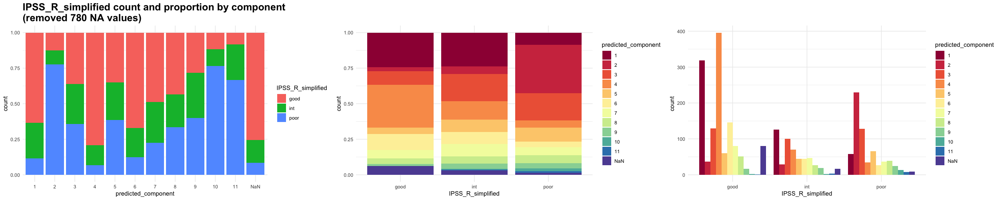

In [67]:
plot_categorical_feature_by_components(dd_clinical, 'IPSS_R_simplified')

In [86]:
plot_survival_curve_stratified_by_categorical_feature <- function(data, mask, stratifier_column_name, legend_prefix, colors, remove_na = FALSE) {
    data$stratify <- 'wildtype'
    data$stratify[mask] <- sprintf('%s_%s', legend_prefix, dd_clinical[mask, stratifier_column_name])
    
    if (remove_na)
        data <- data[! mask | (mask & ! is.na(dd_clinical[stratifier_column_name])),]
    
    stratify_count_table <- get_table(data$stratify, add_total_count = FALSE)
    categories <- as.character(stratify_count_table$values)
    
    return (plot_survival_curve(data, 'stratify', colors))
}

# plot_survival_curve_stratified_by_categorical_feature(dd_clinical, (dd_clinical$predicted_component == 3), 'IPSS_R_simplified', 'comp_3_IPSSR', colors = c('#ABDDA4', '#FDAE61', '#D7191C', 'grey'), remove_na = TRUE)

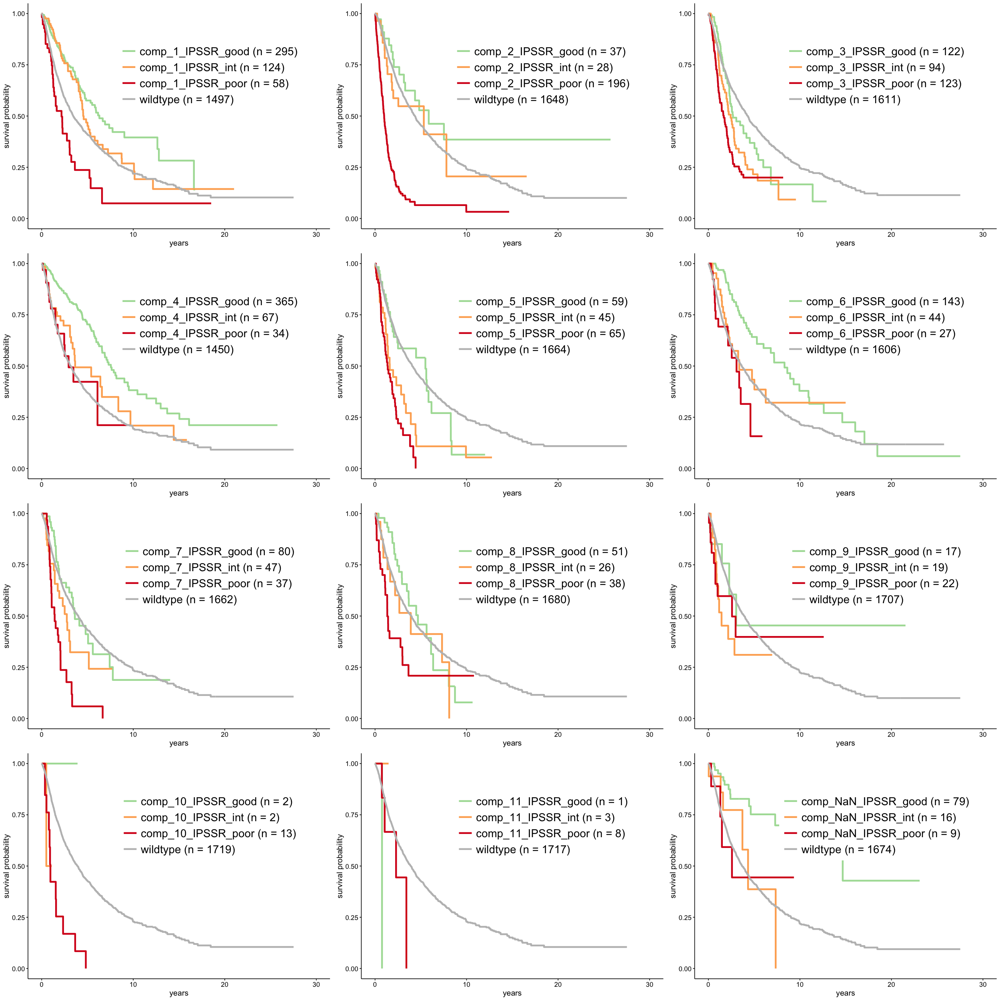

In [58]:
plots <- list()

j <- 1
for (i in levels(dd_clinical$predicted_component)) {
    plots[[j]] <- plot_survival_curve_stratified_by_categorical_feature(dd_clinical, (dd_clinical$predicted_component == i), 'IPSS_R_simplified', sprintf('comp_%s_IPSSR', i), colors = c('#ABDDA4', '#FDAE61', '#D7191C', 'grey'), remove_na = TRUE)
    j <- j + 1
}

set_notebook_plot_size(25, 25)
grid.arrange(grobs = plots, ncol = 3)

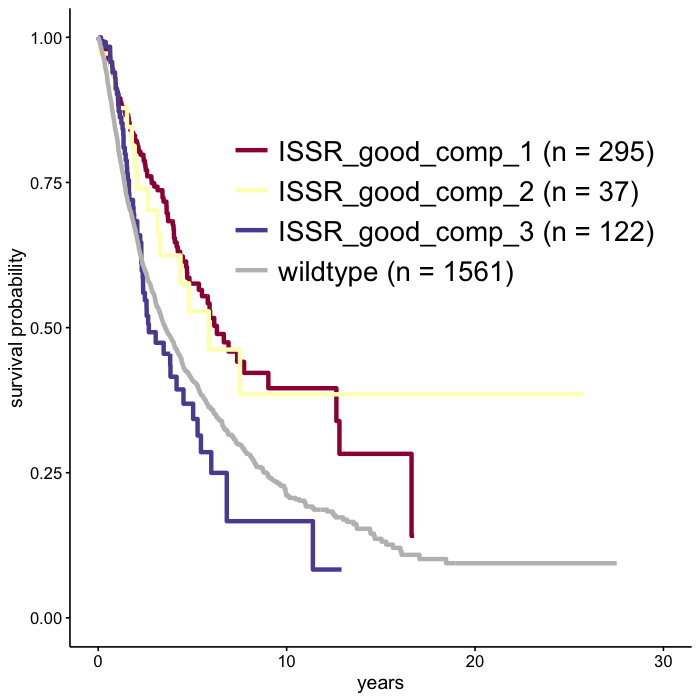

In [96]:
set_notebook_plot_size(7, 7)

mask <- !is.na(dd_clinical$IPSS_R_simplified) & dd_clinical$IPSS_R_simplified == 'good' & dd_clinical$predicted_component %in% c(1, 2, 3)
plot_survival_curve_stratified_by_categorical_feature(dd_clinical, mask, 'predicted_component', 'IPSSR_good_comp', colors = c(colorRampPalette(brewer.pal(11, 'Spectral'))(3), 'grey'), remove_na = TRUE)

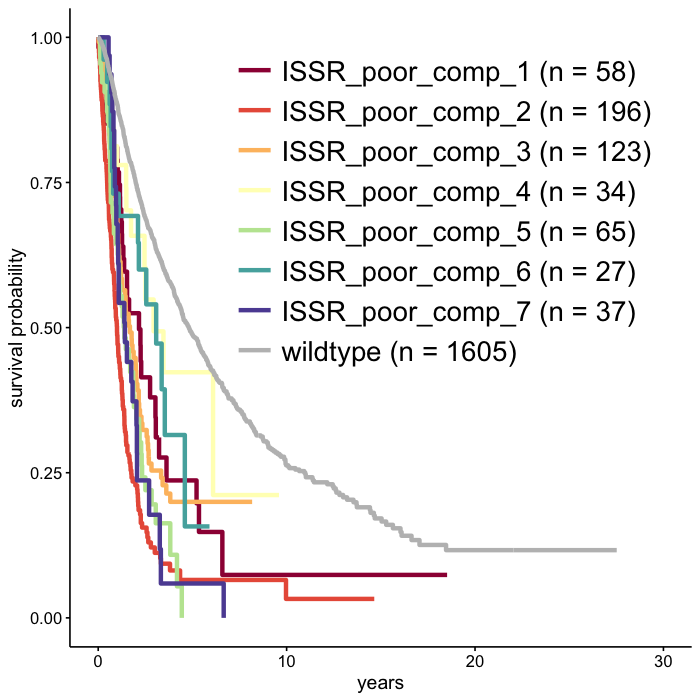

In [98]:
set_notebook_plot_size(7, 7)

mask <- !is.na(dd_clinical$IPSS_R_simplified) & dd_clinical$IPSS_R_simplified == 'poor' & dd_clinical$predicted_component %in% c(1, 2, 3, 4, 5, 6, 7)
plot_survival_curve_stratified_by_categorical_feature(dd_clinical, mask, 'predicted_component', 'IPSSR_poor_comp', colors = c(colorRampPalette(brewer.pal(11, 'Spectral'))(7), 'grey'), remove_na = TRUE)

# VAF distribution

In [104]:
# get maf data
dd_maf <- read.table('data/df_maf_driver_selected.tsv', sep = '\t', stringsAsFactors = FALSE, header = TRUE)

# merge with dd_clustered
dd_maf_clustered <- merge(dd_maf, dd_clustered[,c('patient_key', 'predicted_component')], by.x = 'TARGET_NAME', by.y = 'patient_key')

print_size(dd_maf_clustered)
head(dd_maf_clustered, 2)

Size of dd_maf: 11808 x 160

ID_VARIANT                           TARGET_NAME         
1 c06198e2-9200-11e7-b5e7-eb21424a729f E-H-100000-T1-1-D1-1
2 5_131822301_G_T                      E-H-100000-T1-1-D1-1
  REFERENCE_NAME       CHR START     END       REF ALT CONTEXT_5 CONTEXT_3 QUAL
1 I-H-100778-N1-1-D1-1 11  119149248 119149248 G   A   TTTCT     CCGAT     NA  
2 I-H-100778-N1-1-D1-1 5   131822301 131822301 G   T   ACTGT     TAGCT     NA  
  CALLED_BY PASSED_BY NUMBER_OF_CALLERS FLAGS_ALL TARGET_VAF_MEAN
1 C,S,M     M,S       2                 MNP       0.083          
2 S,M       M,S       2                 PASS      0.022          
  TARGET_VAF_STD REFERENCE_VAF_MEAN REFERENCE_VAF_STD mutect_TARGET_VAF
1 0.003          0.001              0                 0.087            
2 0.002          0.002              0                 0.024            
  mutect_TARGET_DEPTH mutect_REFERENCE_VAF mutect_REFERENCE_DEPTH
1 917                 0.001                1319                  
2 374                 0.002                1145                  
  mutect_DIRPROP mutect_READS_FORWARD mutect_READS_REVERSE strelka_TARGET_VAF
1 1.0            40                   40                   0.079             
2 0.8             5                    4                   0.021             
  strelka_TARGET_DEPTH strelka_REFERENCE_VAF strelka_REFERENCE_DEPTH
1 1308                 0.001                 1613                   
2  532                 0.001                 1376                   
  caveman.pindel_TARGET_VAF caveman.pindel_TARGET_DEPTH
1 0.082                     1308                       
2    NA                       NA                       
  caveman.pindel_REFERENCE_VAF caveman.pindel_REFERENCE_DEPTH
1 0.001                        1612                          
2    NA                          NA                          
  caveman.pindel_DIRPROP caveman.pindel_READS_FORWARD
1 0.672                  64                          
2    NA                  NA                          
  caveman.pindel_READS_REVERSE
1 43                          
2 NA                          
  VAG_VD                                                                                                                                                                              
1 CBL|CCDS8418.1|r.1632g>a|c.1256G>A|p.C419Y|protein_coding:CDS:exon:substitution:codon_variant:non_synonymous_codon|SO:0000010:SO:0000316:SO:0000147:SO:1000002:SO:0001581:SO:0001583
2 IRF1|CCDS4155.1|r.751c>a|c.492C>A|p.Y164*|protein_coding:CDS:exon:substitution:codon_variant:stop_gained|SO:0000010:SO:0000316:SO:0000147:SO:1000002:SO:0001581:SO:0001587          
  VAG_VT VAG_GENE VAG_TRANSCRIPT VAG_RNA_CHANGE VAG_cDNA_CHANGE
1 Sub    CBL      CCDS8418.1     r.1632g>a      c.1256G>A      
2 Sub    IRF1     CCDS4155.1     r.751c>a       c.492C>A       
  VAG_PROTEIN_CHANGE VAG_EFFECT           PROTEIN_CHANGE EFFECT              
1 p.C419Y            non_synonymous_codon p.C419Y        non_synonymous_codon
2 p.Y164*            stop_gained          p.Y164*        stop_gained         
  VAG_AMBIGUOUS_ANNOT VEP_Consequence  VEP_IMPACT ⋯ VEP_gnomAD_exome_AF_AFR
1 1                   missense_variant MODERATE   ⋯  0                     
2 1                   stop_gained      HIGH       ⋯ NA                     
  VEP_gnomAD_exome_AC.AN_AMR VEP_gnomAD_exome_AF_AMR VEP_gnomAD_exome_AC.AN_ASJ
1 0 | 33582                   0                      0 | 9850                  
2                            NA                                                
  VEP_gnomAD_exome_AF_ASJ VEP_gnomAD_exome_AC.AN_EAS VEP_gnomAD_exome_AF_EAS
1  0                      0 | 17248                  0                      
2 NA                                                 NA                     
  VEP_gnomAD_exome_AC.AN_FIN VEP_gnomAD_exome_AF_FIN VEP_gnomAD_exome_AC.AN_NFE
1 0 | 22300                   0                      1 | 111614                
2                            NA                                                
  VEP_

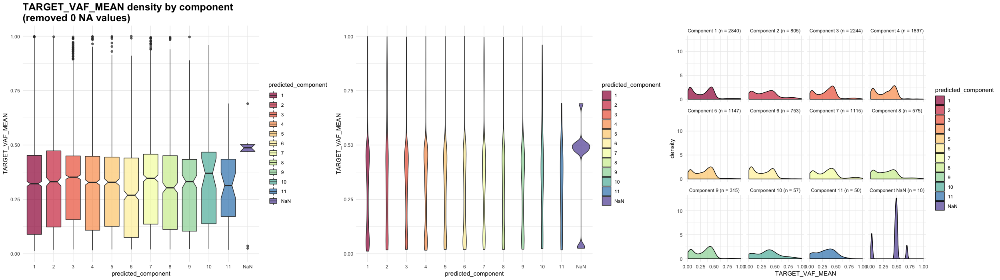

In [106]:
plot_continuous_feature_by_components(dd_maf_clustered, 'TARGET_VAF_MEAN', FALSE)

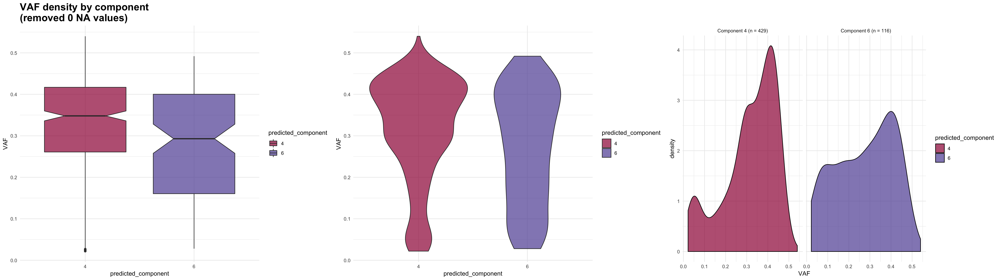

In [155]:
plot_continuous_feature_by_components(dd_maf_clustered[dd_maf_clustered$VAG_GENE == 'SF3B1' & dd_maf_clustered$predicted_component %in% c(4, 6),], 'VAF', FALSE, colors = colorRampPalette(brewer.pal(11, "Spectral"))(2))

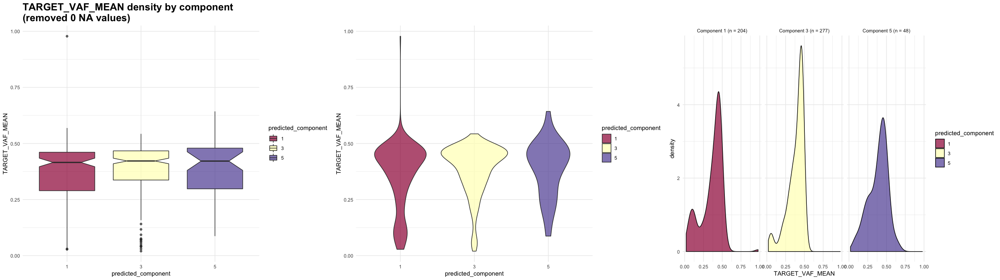

In [126]:
plot_continuous_feature_by_components(dd_maf_clustered[dd_maf_clustered$VAG_GENE == 'SRSF2' & dd_maf_clustered$predicted_component %in% c(1, 3, 5),], 'VAF', FALSE, colors = colorRampPalette(brewer.pal(11, "Spectral"))(3))

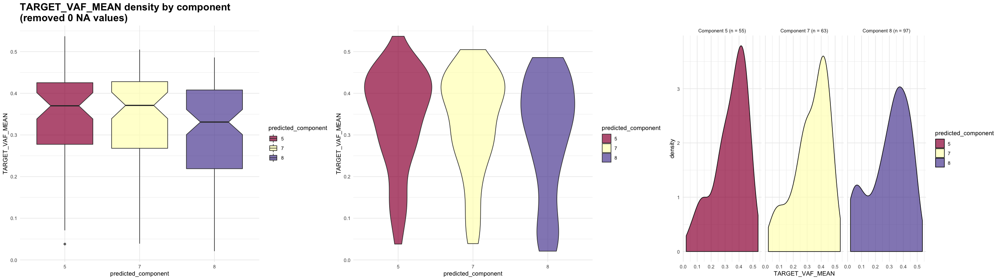

In [131]:
plot_continuous_feature_by_components(dd_maf_clustered[dd_maf_clustered$VAG_GENE == 'U2AF1' & dd_maf_clustered$predicted_component %in% c(5, 7, 8),], 'VAF', FALSE, colors = colorRampPalette(brewer.pal(11, "Spectral"))(3))

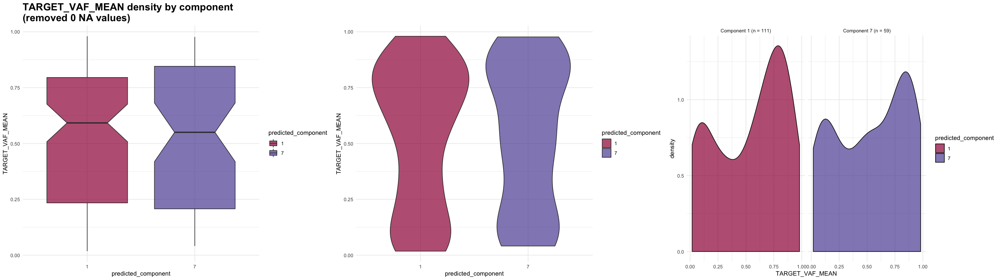

In [132]:
plot_continuous_feature_by_components(dd_maf_clustered[dd_maf_clustered$VAG_GENE == 'ZRSR2' & dd_maf_clustered$predicted_component %in% c(1, 7),], 'VAF', FALSE, colors = colorRampPalette(brewer.pal(11, "Spectral"))(2))

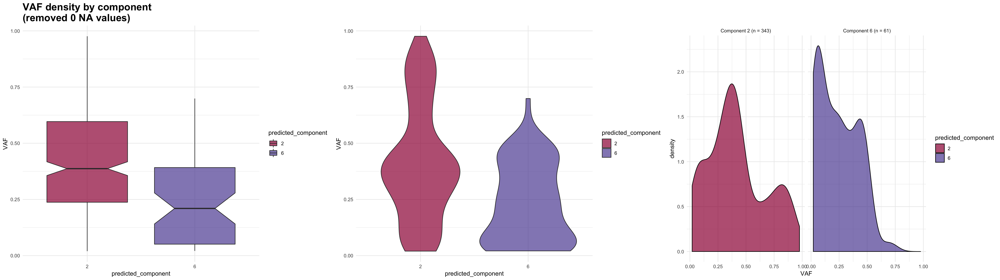

In [154]:
plot_continuous_feature_by_components(dd_maf_clustered[dd_maf_clustered$VAG_GENE == 'TP53' & dd_maf_clustered$predicted_component %in% c(2, 6),], 'VAF', FALSE, colors = colorRampPalette(brewer.pal(11, "Spectral"))(2))